In [1]:
from utils import *

In [2]:
import warnings
warnings.filterwarnings('ignore')

In [3]:
from scipy.stats import pearsonr
import seaborn as sns
from IPython.display import Markdown

# genus

In [4]:
bac = pd.read_excel("data/bac_genus.xlsx", sheet_name=None)

In [5]:
bac.keys()

dict_keys(['m1_rep1', 'm1_rep2', 'm1_rep3', 'm2_rep1', 'm2_rep2', 'm2_rep3'])

In [6]:
nkeys = list(bac['m1_rep1'].keys())[1:]

In [7]:
bac_m1 = []
for i in [1, 2, 3]:
    bac_m1.append(bac[f'm1_rep{i}'])
bac_m2 = []
for i in [1, 2, 3]:
    bac_m2.append(bac[f'm2_rep{i}'])

In [8]:
def filter_rep2(bac_mx):
    meanx = pd.DataFrame(columns=bac_mx[0].keys(), index=bac_mx[0].index)
    meanx['Genus'] = bac_mx[0]['Genus']
    meanx.fillna(0, inplace=True)

    for k in nkeys:
        mask1 = (bac_mx[0][k] != 0)
        mask2 = (bac_mx[1][k] != 0)
        mask3 = (bac_mx[2][k] != 0)

        maskall3 = mask1 & mask2 & mask3
        maskall2 = (mask1 & mask2 & ~mask3) | (mask1 & ~mask2 & mask3) | (~mask1 & mask2 & mask3)
        maskall1 = mask1 | mask2 | mask3

        meanx.loc[maskall3, k] = pd.DataFrame({'df1' : bac_mx[0][maskall3][k], 'df2' : bac_mx[1][maskall3][k], 'df3' : bac_mx[2][maskall3][k]}, dtype=float).mean(axis=1)
        meanx.loc[maskall2, k] = pd.DataFrame({'df1' : bac_mx[0][maskall2][k], 'df2' : bac_mx[1][maskall2][k], 'df3' : bac_mx[2][maskall2][k]}, dtype=float).mean(axis=1)
        # meanx.loc[maskall1, k] = pd.DataFrame({'df1' : bac_mx[0][maskall1][k], 'df2' : bac_mx[1][maskall1][k], 'df3' : bac_mx[2][maskall1][k]}).mean(axis=1)
        
        meanx.loc[((~mask1 & ~mask2 & mask3) | (mask1 & ~mask2 & ~mask3) | (~mask1 & mask2 & ~mask3)), k] = np.nan
        # meanx.loc[(~maskall1), k] = np.nan

    return meanx.dropna()

In [9]:
def filter_zero(bac_mx_m):
     return bac_mx_m[~(bac_mx_m[nkeys] == 0).all(axis=1)]

In [10]:
bac_m1_m_o = filter_rep2(bac_m1)
bac_m2_m_o = filter_rep2(bac_m2)

In [11]:
bac_m1_m_o = filter_zero(bac_m1_m_o)
bac_m2_m_o = filter_zero(bac_m2_m_o)

In [12]:
bac_m1_m_o = bac_m1_m_o.set_index('Genus')
bac_m2_m_o = bac_m2_m_o.set_index('Genus')

In [13]:
mb_m1_o = pd.read_hdf('generated/a_cecal_mouse_1.hdf5', 'cvfiltered')
mb_m1_o = mb_m1_o.set_index('Metabolite Name')
mb_m1_o = mb_m1_o[['0_con', '7_con', '7_dss', '7_ab', '7_dab', '15_con', '15_dss_ab', '15_ab_dss', '15_dss_h2o', '15_ab_h2o', '15_dab_h2o']]
mb_m2_o = pd.read_hdf('generated/a_cecal_mouse_2.hdf5', 'cvfiltered')
mb_m2_o = mb_m2_o.set_index('Metabolite Name')
mb_m2_o = mb_m2_o[['0_con', '7_con', '7_dss', '7_ab', '7_dab', '15_con', '15_dss_ab', '15_ab_dss', '15_dss_h2o', '15_ab_h2o', '15_dab_h2o']]

## m1

Anaerosporobacter_mobilis Bacteroides Blautia Chloroplast Enterobacter Escherichia-Shigella Hungatella Intestinimonas Lachnotalea Mitochondria Muribaculaceae Paracoccus Prevotellaceae Rikenella Robinsoniella Roseburia Sphingomonas UBA1819 (8, 699)


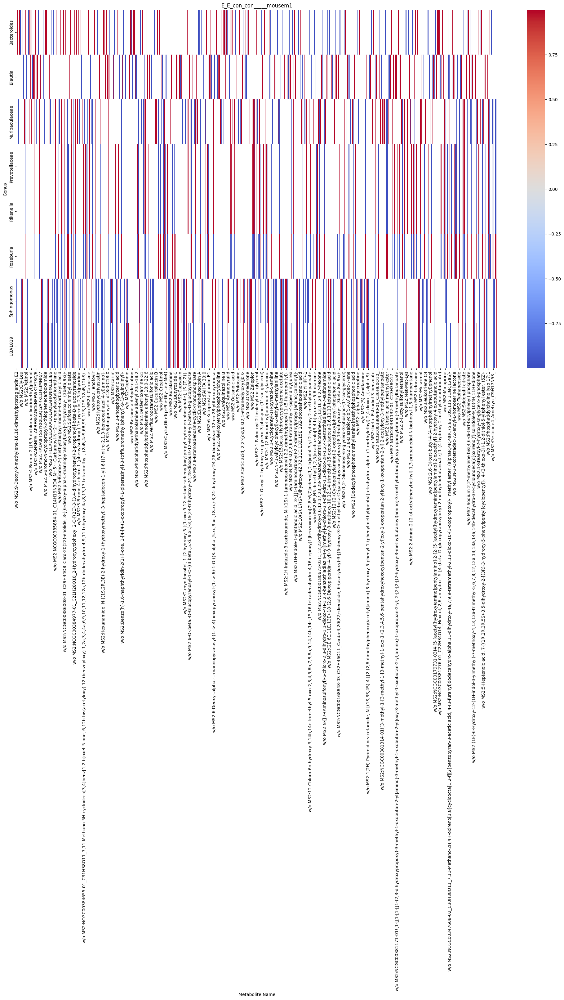

Anaerosporobacter_mobilis Bacteroides Blautia Chloroplast Enterobacter Escherichia-Shigella Hungatella Intestinimonas Lachnotalea Mitochondria Muribaculaceae Paracoccus Prevotellaceae Rikenella Robinsoniella Roseburia Sphingomonas UBA1819 (10, 1059)


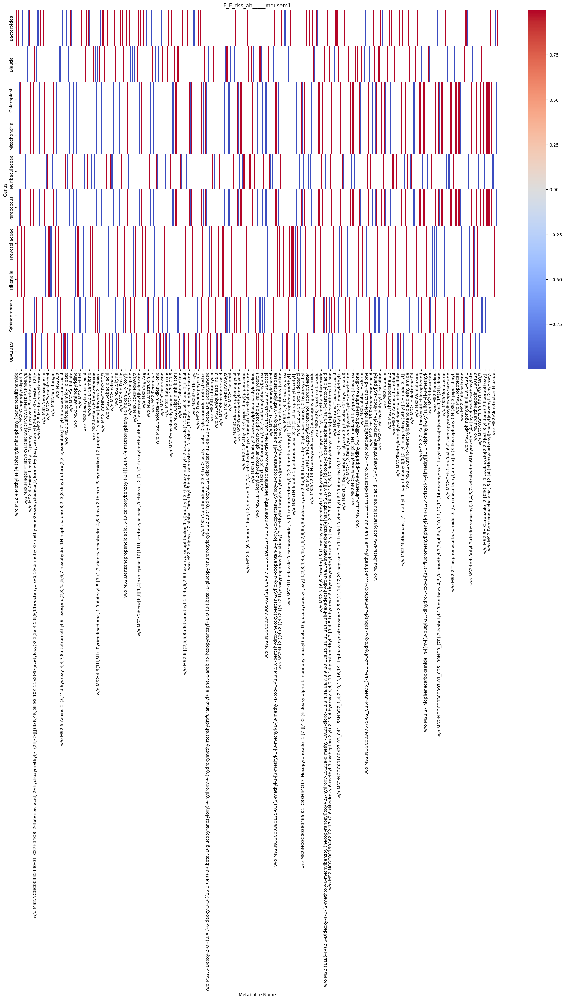

Anaerosporobacter_mobilis Bacteroides Blautia Chloroplast Enterobacter Escherichia-Shigella Hungatella Intestinimonas Lachnotalea Mitochondria Muribaculaceae Paracoccus Prevotellaceae Rikenella Robinsoniella Roseburia Sphingomonas UBA1819 (7, 1011)


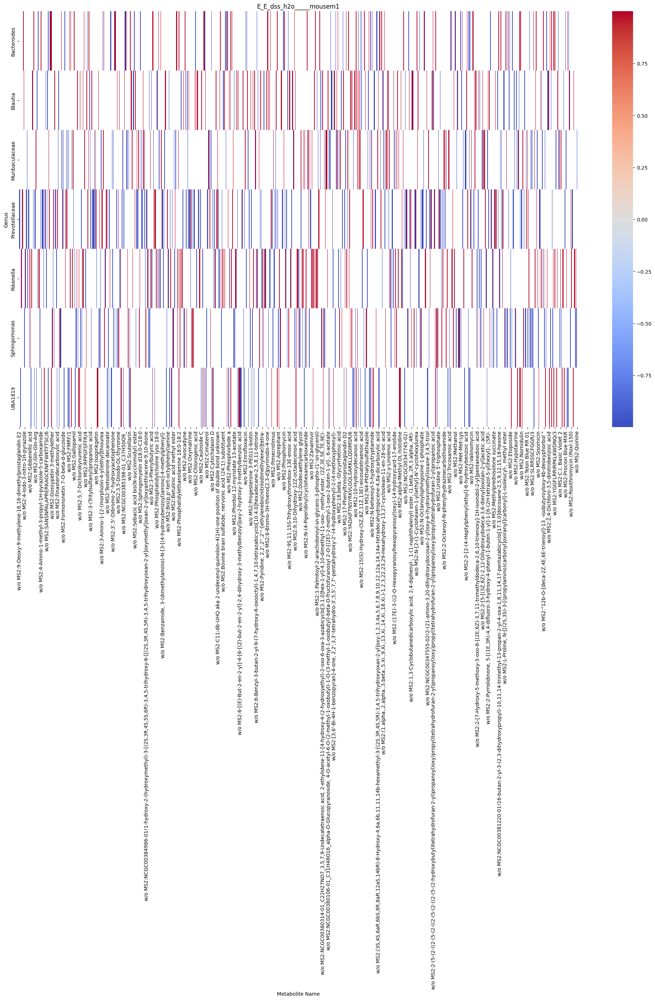

Anaerosporobacter_mobilis Bacteroides Blautia Chloroplast Enterobacter Escherichia-Shigella Hungatella Intestinimonas Lachnotalea Mitochondria Muribaculaceae Paracoccus Prevotellaceae Rikenella Robinsoniella Roseburia Sphingomonas UBA1819 (7, 440)


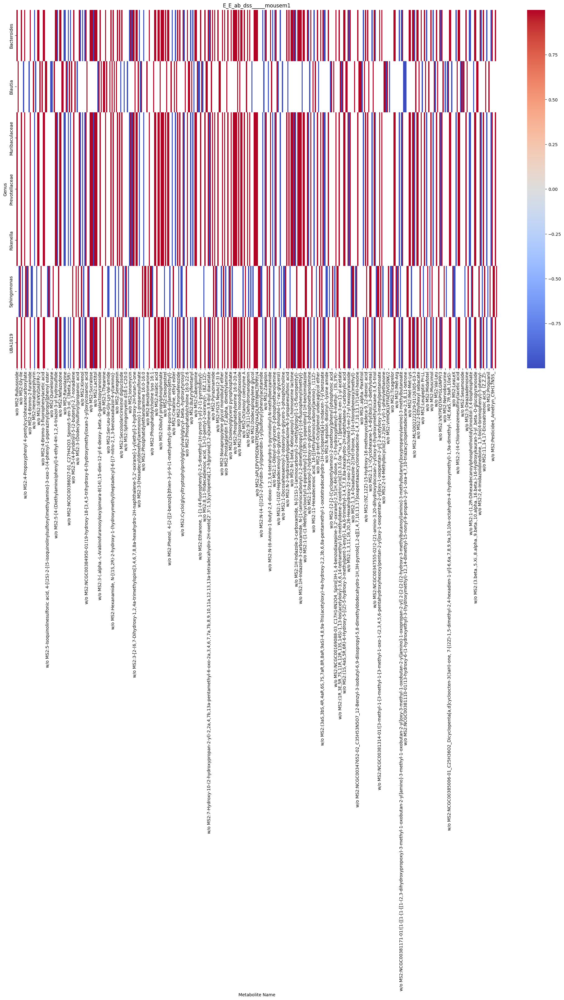

Anaerosporobacter_mobilis Bacteroides Blautia Chloroplast Enterobacter Escherichia-Shigella Hungatella Intestinimonas Lachnotalea Mitochondria Muribaculaceae Paracoccus Prevotellaceae Rikenella Robinsoniella Roseburia Sphingomonas UBA1819 (7, 976)


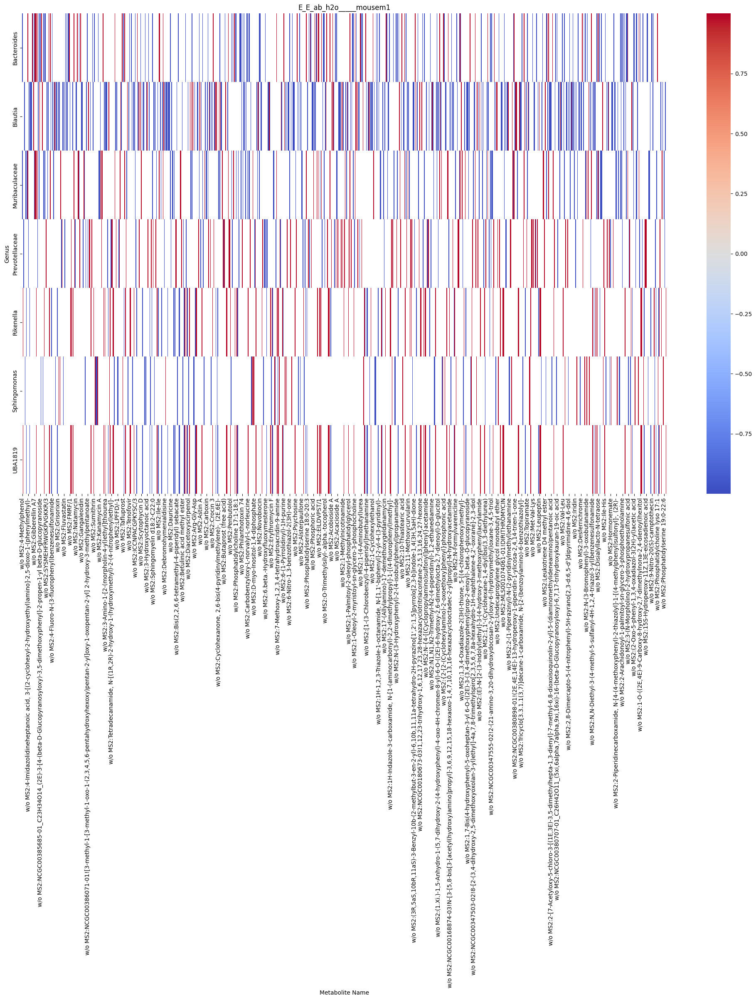

Anaerosporobacter_mobilis Bacteroides Blautia Chloroplast Enterobacter Escherichia-Shigella Hungatella Intestinimonas Lachnotalea Mitochondria Muribaculaceae Paracoccus Prevotellaceae Rikenella Robinsoniella Roseburia Sphingomonas UBA1819 (14, 846)


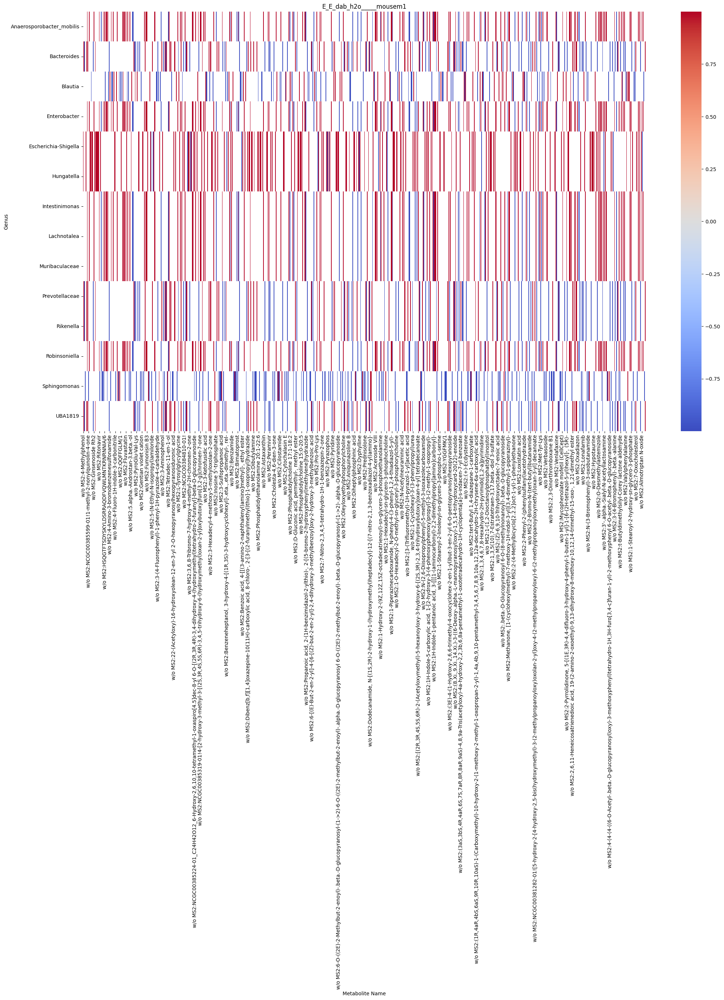

In [14]:
bac_m1_m_o = bac_m1_m_o[['d0con', 'd7con', 'd7dss', 'd7ab', 'd7dab', 'd15con', 'd15dss_ab', 'd15ab_dss', 'd15dss_h2o', 'd15ab_h2o', 'd15dab_h2o']]

condlist = ['con', 'dss', 'ab', 'dab', 'h2o']

for k1 in condlist:
    for k2 in condlist:
        try:
            e = Experiment2(k1, k2, mb_m1_o, dfname='', mouse='m1')
            if k2 != 'con':
                bac_m1_m = bac_m1_m_o[['d0con', f'd7{k1}', f'd15{k1}_{k2}']]
            else:
                bac_m1_m = bac_m1_m_o[['d0con', 'd7con', 'd15con']]
            mb_m1 = mb_m1_o[e.points]
            smatrix = np.zeros([len(bac_m1_m), len(mb_m1)])
            pmatrix = np.zeros([len(bac_m1_m), len(mb_m1)])
            for i in range(len(bac_m1_m)):
                for j in range(len(mb_m1)):
                    s, p = pearsonr(mb_m1.iloc[j].to_numpy(), bac_m1_m.iloc[i].to_numpy())
                    smatrix[i, j] = s
                    pmatrix[i, j] = p
                print(bac_m1_m.index[i], end=' ')
            corr_df = pd.DataFrame(smatrix, columns=mb_m1.index, index=bac_m1_m.index)
            smatrix_sig = smatrix.copy()
            maskpm = pmatrix > 0.05      #    pearson p
            smatrix_sig[maskpm] = 0
            corr_df_sig = pd.DataFrame(smatrix_sig, columns=mb_m1.index, index=bac_m1_m.index)

            corr_df_sig = corr_df_sig.fillna(0)

            corr_df_sig = corr_df_sig.loc[(corr_df_sig != 0).any(axis=1)]
            corr_df_sig = corr_df_sig.loc[:, (corr_df_sig != 0).any(axis=0)]

            corr_df_sig[corr_df_sig == 0] = np.nan
            print(corr_df_sig.shape)
            
            pyplot.rcParams['figure.figsize'] = (25, 15)
            sns.heatmap(corr_df_sig, cmap='coolwarm')
            pyplot.title(e.name)
            pyplot.show()
            corr_df_sig.to_csv(f"generated/correationr/m1/genus/{e.name}.csv")
            corr_df_sig_p = corr_df_sig.unstack().sort_values(ascending=False).head(50).reset_index()
            corr_df_sig_p.to_csv(f"generated/outliers/m1/genus/pos/{e.name}.csv")
            corr_df_sig_n = corr_df_sig.unstack().sort_values(ascending=True).head(50).reset_index()
            corr_df_sig_n.to_csv(f"generated/outliers/m1/genus/neg/{e.name}.csv")
        except ExperimentException as e:
            pass
            # print(e.value)

## m2

A2 Akkermansia Bacteroides Gastranaerophilales Odoribacter Ruminococcus Sphingomonas UCG-005 

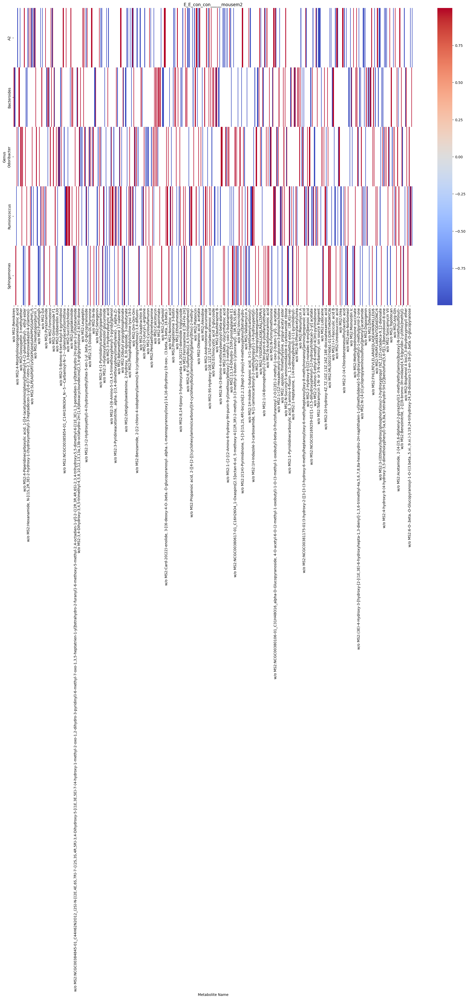

A2 Akkermansia Bacteroides Gastranaerophilales Odoribacter Ruminococcus Sphingomonas UCG-005 

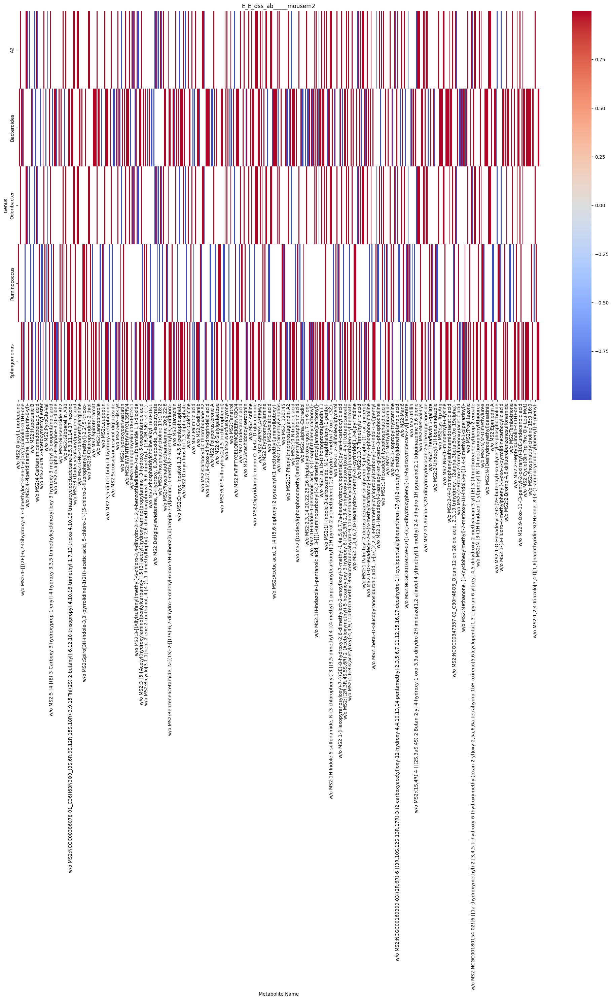

A2 Akkermansia Bacteroides Gastranaerophilales Odoribacter Ruminococcus Sphingomonas UCG-005 

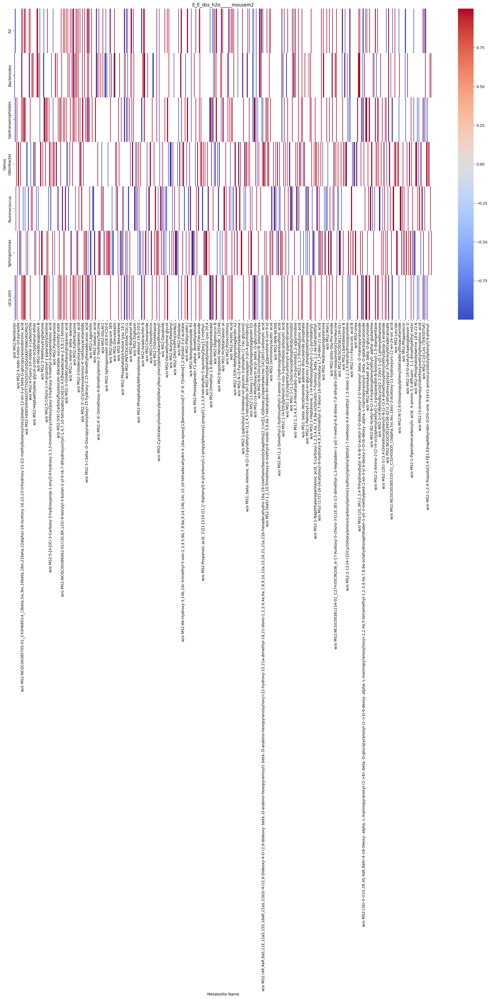

A2 Akkermansia Bacteroides Gastranaerophilales Odoribacter Ruminococcus Sphingomonas UCG-005 

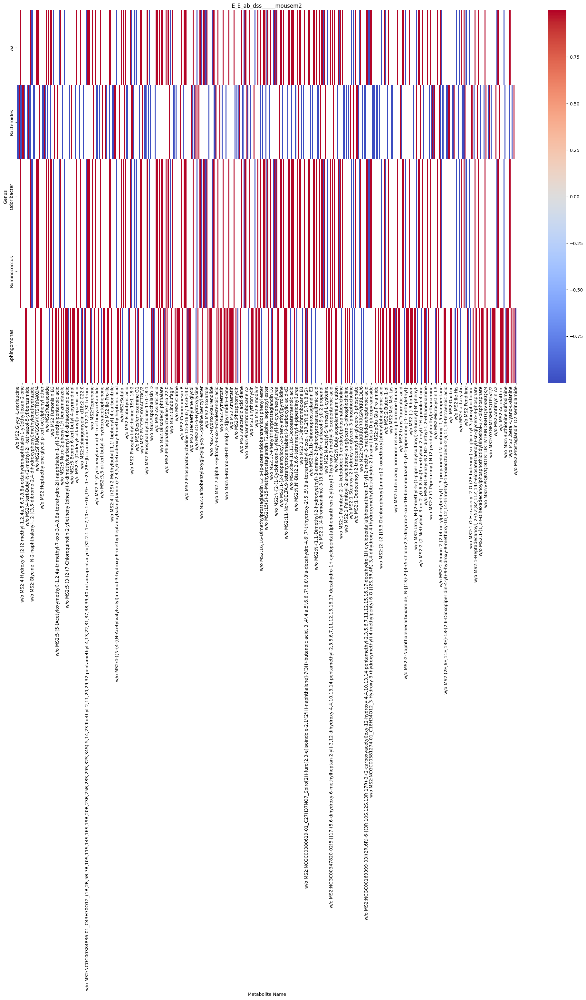

A2 Akkermansia Bacteroides Gastranaerophilales Odoribacter Ruminococcus Sphingomonas UCG-005 

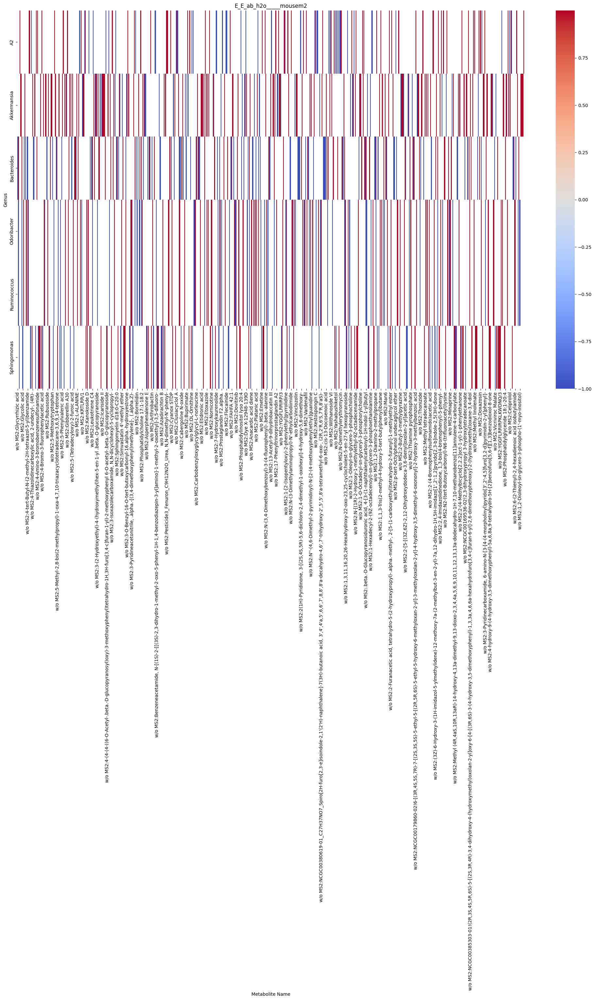

A2 Akkermansia Bacteroides Gastranaerophilales Odoribacter Ruminococcus Sphingomonas UCG-005 

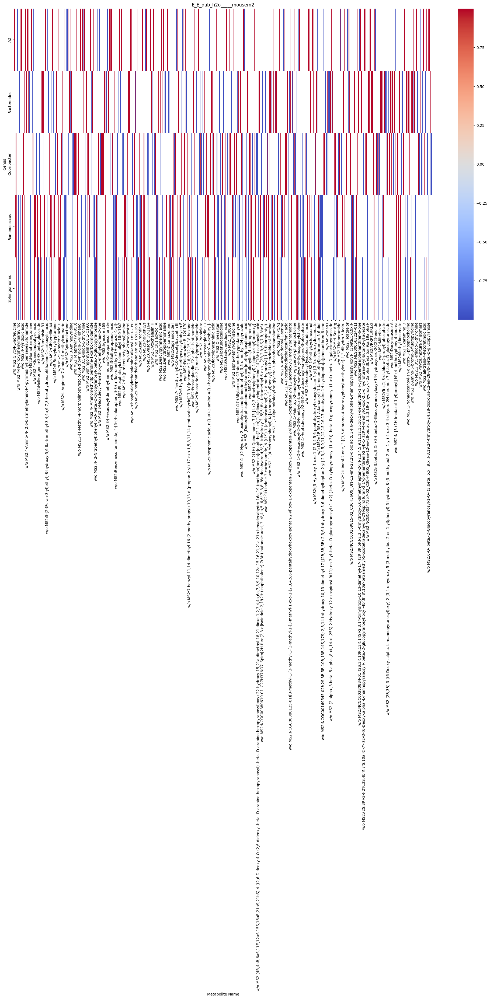

In [15]:
bac_m2_m_o = bac_m2_m_o[['d0con', 'd7con', 'd7dss', 'd7ab', 'd7dab', 'd15con', 'd15dss_ab', 'd15ab_dss', 'd15dss_h2o', 'd15ab_h2o', 'd15dab_h2o']]

condlist = ['con', 'dss', 'ab', 'dab', 'h2o']

for k1 in condlist:
    for k2 in condlist:
        try:
            e = Experiment2(k1, k2, mb_m2_o, dfname='', mouse='m2')
            if k2 != 'con':
                bac_m2_m = bac_m2_m_o[['d0con', f'd7{k1}', f'd15{k1}_{k2}']]
            else:
                bac_m2_m = bac_m2_m_o[['d0con', 'd7con', 'd15con']]
            mb_m2 = mb_m2_o[e.points]
            smatrix = np.zeros([len(bac_m2_m), len(mb_m2)])
            pmatrix = np.zeros([len(bac_m2_m), len(mb_m2)])
            for i in range(len(bac_m2_m)):
                for j in range(len(mb_m2)):
                    s, p = pearsonr(mb_m2.iloc[j].to_numpy(), bac_m2_m.iloc[i].to_numpy())
                    smatrix[i, j] = s
                    pmatrix[i, j] = p
                print(bac_m2_m.index[i], end = ' ')
            corr_df = pd.DataFrame(smatrix, columns=mb_m2.index, index=bac_m2_m.index)
            smatrix_sig = smatrix.copy()
            maskpm = pmatrix > 0.05      # Pearson P
            smatrix_sig[maskpm] = 0
            corr_df_sig = pd.DataFrame(smatrix_sig, columns=mb_m2.index, index=bac_m2_m.index)
            
            corr_df_sig = corr_df_sig.fillna(0)

            corr_df_sig = corr_df_sig.loc[(corr_df_sig != 0).any(axis=1)]
            corr_df_sig = corr_df_sig.loc[:, (corr_df_sig != 0).any(axis=0)]
            corr_df_sig[corr_df_sig == 0] = np.nan
            
            pyplot.rcParams['figure.figsize'] = (25, 15)
            sns.heatmap(corr_df_sig, cmap='coolwarm')
            pyplot.title(e.name)
            pyplot.show()
            corr_df_sig.to_csv(f"generated/correationr//m2/genus/{e.name}.csv")
            corr_df_sig_p = corr_df_sig.unstack().sort_values(ascending=False).head(50).reset_index()
            corr_df_sig_p.to_csv(f"generated/outliers/m2/genus/pos/{e.name}.csv")
            corr_df_sig_n = corr_df_sig.unstack().sort_values(ascending=True).head(50).reset_index()
            corr_df_sig_n.to_csv(f"generated/outliers/m2/genus/neg/{e.name}.csv")
        except ExperimentException as e:
            # print(e.value)
            pass